In [28]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

# feature selection
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif, chi2
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import VarianceThreshold
from mlxtend.feature_selection import ExhaustiveFeatureSelector
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE

# Classification models.
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.linear_model import SGDClassifier

### Path for data file.

In [2]:
current_directory = str(os.getcwd())
print(current_directory)
# path, directory = os.path.split(current_directory)
data_file = os.path.join(str(current_directory),"..\Datasets\wine\winequality-red.csv")
print(data_file)

D:\Codes\Projects
D:\Codes\Projects\..\Datasets\wine\winequality-red.csv


### Reading the file.

In [3]:
data = pd.read_csv(data_file)
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [4]:
data.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

### Creating a data profile using pandas_profiling

In [5]:
prof = ProfileReport(data) 

In [6]:
prof

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Heatmap for columns

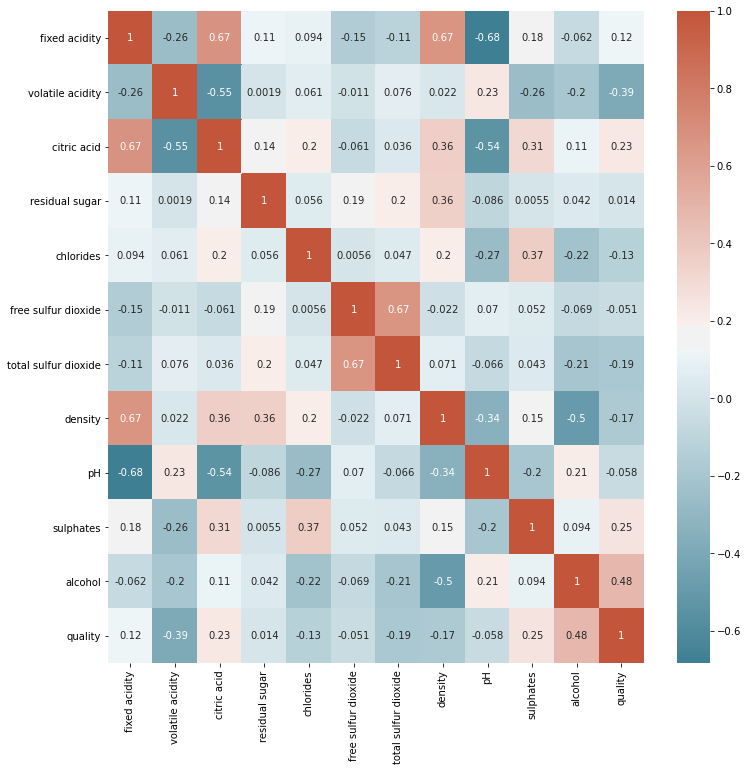

In [7]:
fig_dims = (12, 12)
fig, ax = plt.subplots(figsize=fig_dims)
sns.heatmap(data.corr(), xticklabels=data.columns, yticklabels=data.columns, annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True), annot_kws={'size': 10}, ax=ax)

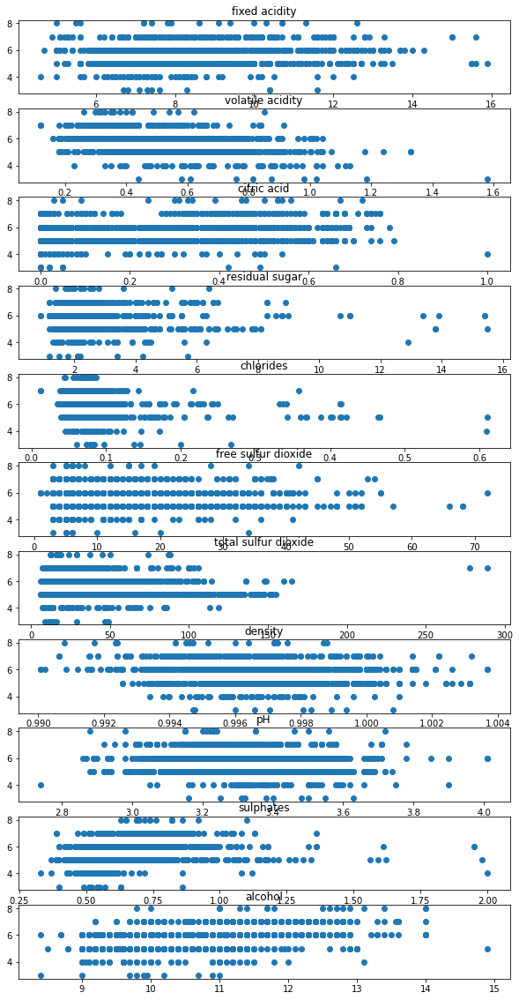

In [8]:
fig, axs = plt.subplots(11, figsize =(10, 20), sharex=False, sharey=False)
cnt = 0
for i in range(len(data.columns) - 1):
    if data.columns[i] == "quality":
        continue
    else:
        axs[cnt].scatter(data[data.columns[i]], data["quality"])
        axs[cnt].set_title(data.columns[i])
        cnt += 1

### Converting the problem to a Classification Problem.

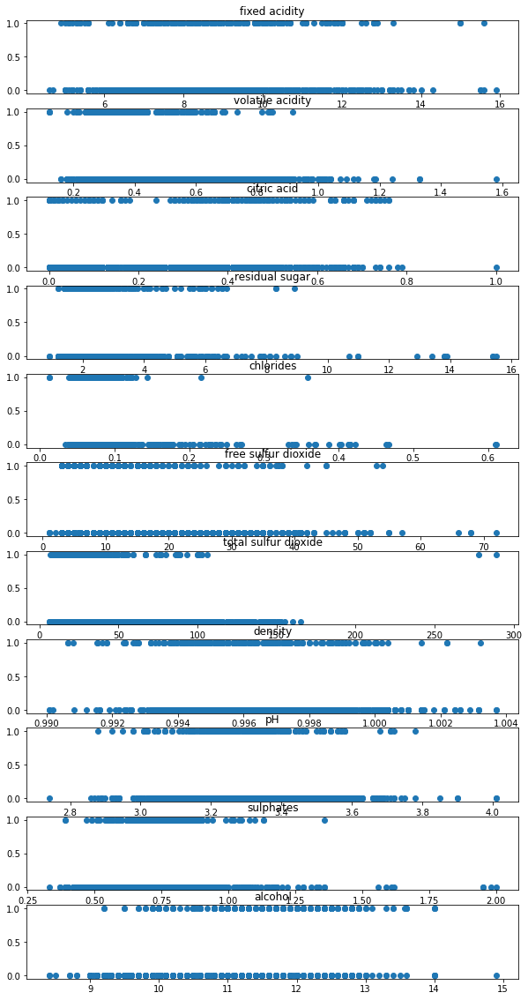

In [11]:
fig, axs = plt.subplots(11, figsize =(10, 20), sharex=False, sharey=False)
cnt = 0
for i in range(len(X.columns)):
    axs[cnt].scatter(X[X.columns[i]], y)
    axs[cnt].set_title(X.columns[i])
    cnt += 1
        

In [9]:
data['goodquality'] = [1 if x >= 7 else 0 for x in data['quality']]

In [10]:
y = data['goodquality']
X = data.drop(['quality','goodquality'], axis = 1)

### Looking at the new labels.

In [12]:
data['goodquality'].value_counts()

0    1382
1     217
Name: goodquality, dtype: int64

### Basic data transformation and splitting of data.

In [13]:
X = StandardScaler().fit_transform(X)

In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=0)

In [15]:
y_test.value_counts()

0    355
1     45
Name: goodquality, dtype: int64

### First Model : DecisionTreeClassifier.

In [16]:
model1 = DecisionTreeClassifier(random_state=1)
model1.fit(X_train, y_train)
y_pred1 = model1.predict(X_test)

In [17]:
print(confusion_matrix(y_test, y_pred1))
print()
print(classification_report(y_test, y_pred1))

[[326  29]
 [ 12  33]]

              precision    recall  f1-score   support

           0       0.96      0.92      0.94       355
           1       0.53      0.73      0.62        45

    accuracy                           0.90       400
   macro avg       0.75      0.83      0.78       400
weighted avg       0.92      0.90      0.90       400



### Second Model : RandomForestClassifier

In [18]:
model2 = RandomForestClassifier(random_state=1)
model2.fit(X_train, y_train)
y_pred2 = model2.predict(X_test)

In [19]:
print(confusion_matrix(y_test, y_pred2))
print()
print(classification_report(y_test, y_pred2))

[[343  12]
 [ 19  26]]

              precision    recall  f1-score   support

           0       0.95      0.97      0.96       355
           1       0.68      0.58      0.63        45

    accuracy                           0.92       400
   macro avg       0.82      0.77      0.79       400
weighted avg       0.92      0.92      0.92       400



### Third Model : AdaBoostClassifier.

In [20]:
model3 = AdaBoostClassifier(random_state=1)
model3.fit(X_train, y_train)
y_pred3 = model3.predict(X_test)

In [21]:
print(confusion_matrix(y_test, y_pred3))
print()
print(classification_report(y_test, y_pred3))

[[334  21]
 [ 23  22]]

              precision    recall  f1-score   support

           0       0.94      0.94      0.94       355
           1       0.51      0.49      0.50        45

    accuracy                           0.89       400
   macro avg       0.72      0.71      0.72       400
weighted avg       0.89      0.89      0.89       400



### Fourth Model : GradientBoostingClassifier.

In [22]:
model4 = GradientBoostingClassifier(random_state=1)
model4.fit(X_train, y_train)
y_pred4 = model4.predict(X_test)

In [23]:
print(confusion_matrix(y_test, y_pred4))
print()
print(classification_report(y_test, y_pred4))

[[334  21]
 [ 22  23]]

              precision    recall  f1-score   support

           0       0.94      0.94      0.94       355
           1       0.52      0.51      0.52        45

    accuracy                           0.89       400
   macro avg       0.73      0.73      0.73       400
weighted avg       0.89      0.89      0.89       400



### Fifth Model : XGBClassifier.

In [24]:
model5 = xgb.XGBClassifier(random_state=1)
model5.fit(X_train, y_train)
y_pred5 = model5.predict(X_test)

C:\Users\asus\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:10:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [25]:
print(confusion_matrix(y_test, y_pred5))
print()
print(classification_report(y_test, y_pred5))

[[336  19]
 [ 14  31]]

              precision    recall  f1-score   support

           0       0.96      0.95      0.95       355
           1       0.62      0.69      0.65        45

    accuracy                           0.92       400
   macro avg       0.79      0.82      0.80       400
weighted avg       0.92      0.92      0.92       400



### Sixth Model : SGDClassifier.

In [26]:
model6 = SGDClassifier(penalty=None)
model6.fit(X_train, y_train)
y_pred6 = model6.predict(X_test)

In [27]:
print(confusion_matrix(y_test, y_pred6))
print()
print(classification_report(y_test, y_pred6))

[[337  18]
 [ 37   8]]

              precision    recall  f1-score   support

           0       0.90      0.95      0.92       355
           1       0.31      0.18      0.23        45

    accuracy                           0.86       400
   macro avg       0.60      0.56      0.57       400
weighted avg       0.83      0.86      0.85       400



In [30]:
y = data['goodquality']
X = data.drop(['quality','goodquality'], axis = 1)

### Feature importance

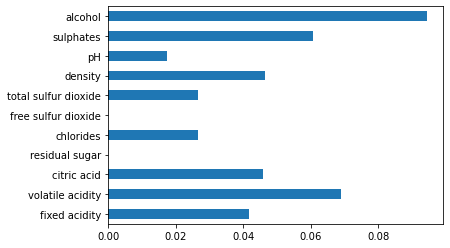

In [31]:
imp = mutual_info_classif(X,y)
feat_imp = pd.Series(imp, X.columns)
feat_imp.plot(kind='barh')
plt.show()

In [38]:
rfe = RFE(RandomForestClassifier(), n_features_to_select=1)
rfe.fit(X,y)
print("Ranking of the features by importance :")
for i in range(len(X.columns)):
    print(X.columns[i], " : ", rfe.ranking_[i])

Ranking of the features by importance :
fixed acidity  :  7
volatile acidity  :  3
citric acid  :  5
residual sugar  :  9
chlorides  :  8
free sulfur dioxide  :  10
total sulfur dioxide  :  6
density  :  1
pH  :  11
sulphates  :  4
alcohol  :  2


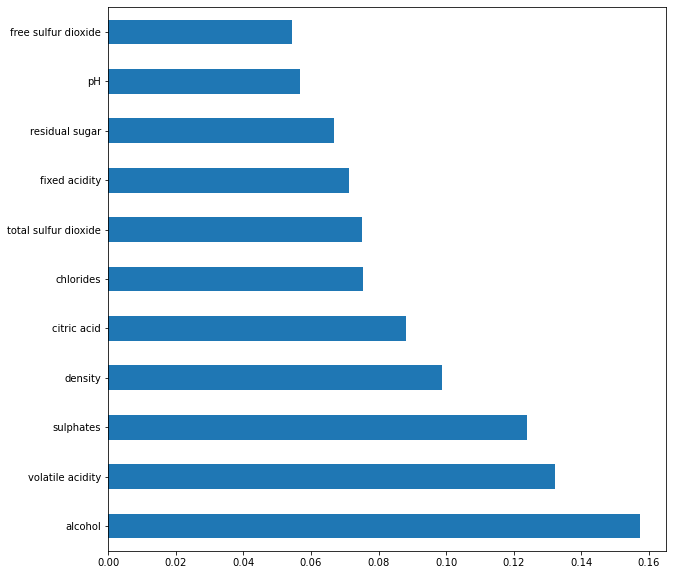

In [39]:
feat_importances = pd.Series(model2.feature_importances_, index=X.columns)
feat_importances.nlargest(25).plot(kind='barh',figsize=(10,10))

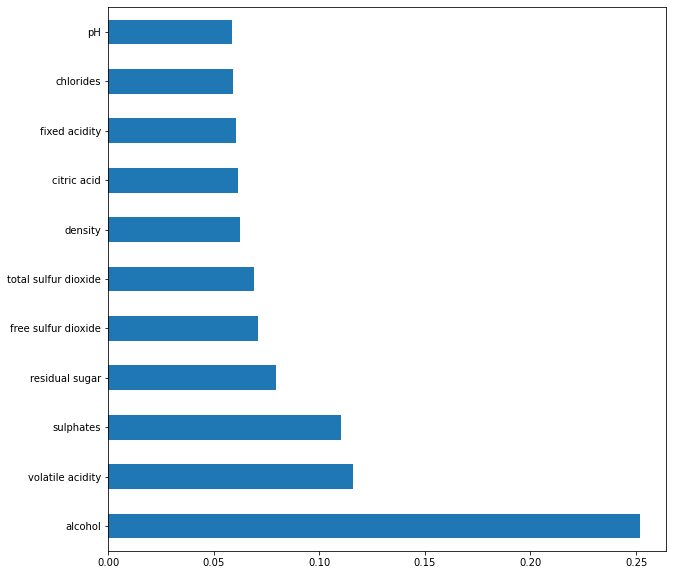

In [40]:
feat_importances = pd.Series(model5.feature_importances_, index=X.columns)
feat_importances.nlargest(25).plot(kind='barh',figsize=(10,10))